## Sim Demo

### Imports

In [11]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
from env.imports import *

In [13]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

importlib.reload(sim.sim)
importlib.reload(sim.sim_run) 

relative_root_path /scratch/asr655/neuroinformatics/GeneEx2Conn
absolute_root_path /scratch/asr655/neuroinformatics/GeneEx2Conn


<module 'sim.sim_run' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/sim/sim_run.py'>

#### Check job specs

In [14]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 40.9%
RAM Usage: 7.8%
Available RAM: 1.4T
Total RAM: 1.5T
52.4G


In [15]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


None
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.06 GB


In [16]:
print("XGBoost version:", xgboost.__version__)
print("cupy version:", cp.__version__)

GPUtil.getAvailable()

# if a number is seen a GPU is available
GPUtil.getGPUs()

DEVICE_ID_LIST = GPUtil.getFirstAvailable()
DEVICE_ID = DEVICE_ID_LIST[0] # grab first element from list
if DEVICE_ID != None: 
    print('GPU found', DEVICE_ID)
    use_gpu = True

    GPUtil.showUtilization()

XGBoost version: 2.0.3
cupy version: 13.1.0
GPU found 0
| ID | GPU | MEM |
------------------
|  0 |  0% |  1% |


In [17]:
torch.cuda.is_available()

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

#### Simulation tests <a id="sims"></a>

Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
feature_name:  transcriptome
processing_type:  None
features ['transcriptome']
X generated... expanding to pairwise dataset
2
3
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'encoder_indices': array([  1,   2,   3,   4,   6,   7,   8,  10,  12,  13,  14,  16,  18,
        20,  21,  23,  26,  27,  28,  29,  32,  34,  35,  36,  37,  38,
        40,  41,  43,  44,  47,  48,  49,  50,  51,  52,  53,  54,  58,
        59,  60,  61,  62,  63,  64,  65,  67,  68,  69,  71,  74,  80,
        81,  83,  85,  86,  87,  88,  89,  91,  92,  95,  96,  97,  98,
        99, 100, 102, 103, 105, 106, 107, 108, 109, 

  warnings.warn(



X_full shape: (455, 7380)
Y_full shape: (455, 455)
X_train shape: (341, 7380)
Y_train shape: (341, 341)
x_projector shape: torch.Size([7380, 10])
x_loadings shape: torch.Size([7380, 10])
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.06 GB
Best val loss so far at epoch 1: 0.0416
Best val loss so far at epoch 2: 0.0355
Best val loss so far at epoch 3: 0.0304
Best val loss so far at epoch 5: 0.0287
Epoch 5/100, Train Loss: 0.0488, Val Loss: 0.0287, Time: 1.91s
Best val loss so far at epoch 6: 0.0275
Best val loss so far at epoch 7: 0.0273
Best val loss so far at epoch 8: 0.0264
Best val loss so far at epoch 9: 0.0258
Best val loss so far at epoch 10: 0.0244
Epoch 10/100, Train Loss: 0.0286, Val Loss: 0.0244, Time: 1.94s
Best val loss so far at epoch 11: 0.0237
Best val loss so far at epoch 12: 0.0230
Best val loss so far at epoch 13: 0.0223
Best val loss so far at epoch 14: 0.0214
Best val loss so far at epoch 15: 0.0209
Epoch 15/100, Train Loss: 0.0231, Val Loss: 0

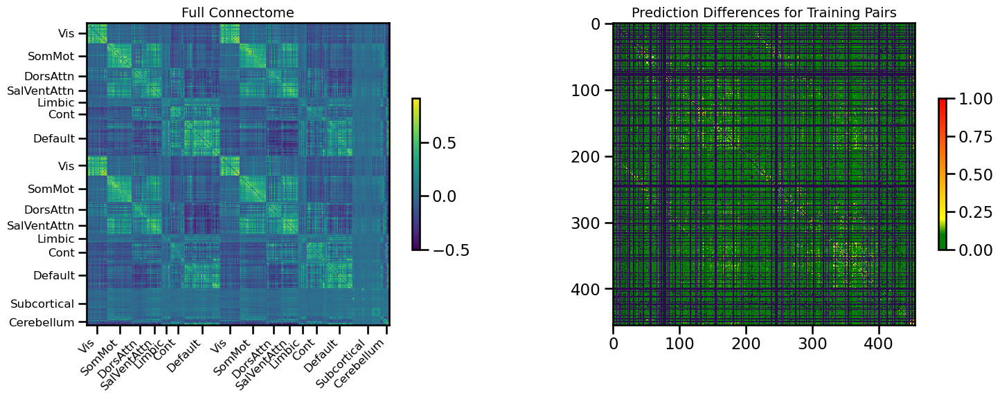

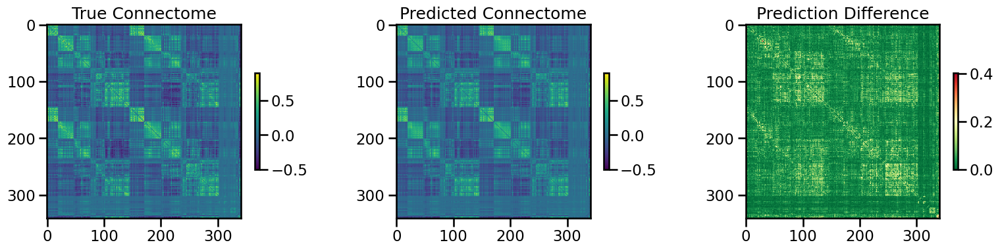

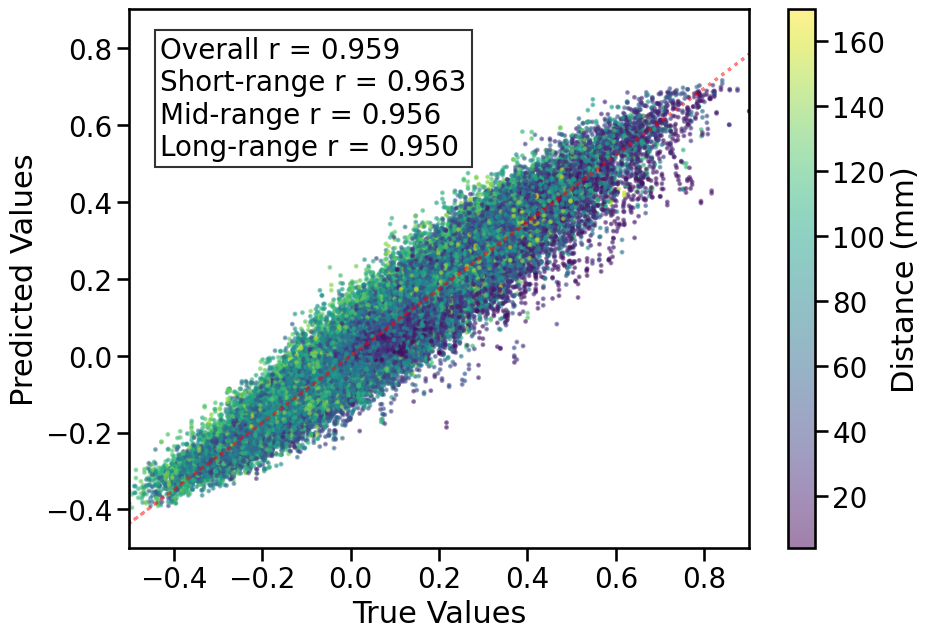

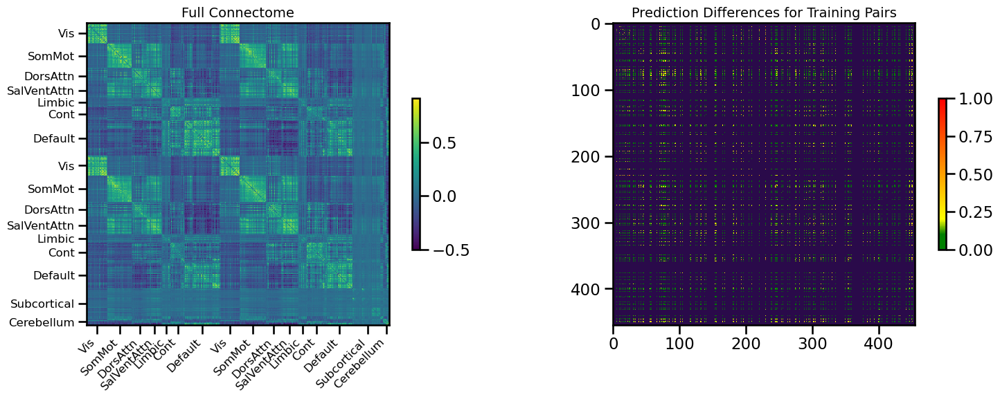

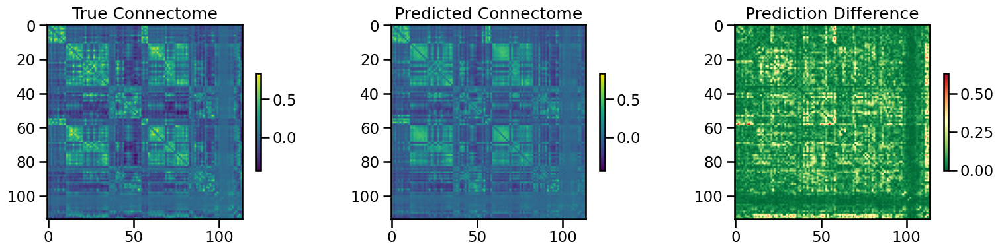

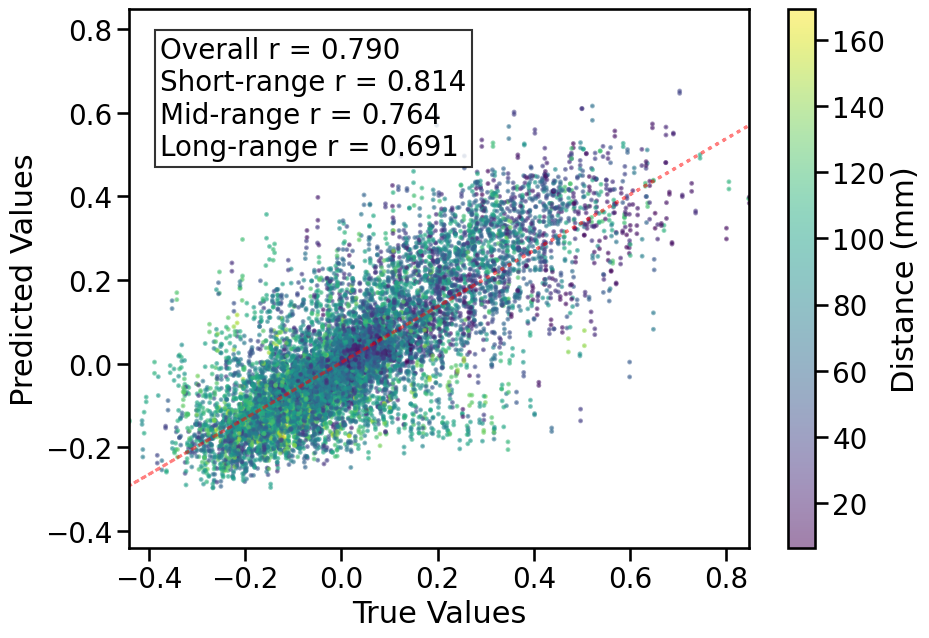


TRAIN METRICS: {'mse': 0.0028198673, 'mae': 0.038137913, 'r2': 0.9167591711248866, 'pearson_corr': 0.9589912383490866, 'geodesic_distance': 16.988054884348387}
TEST METRICS: {'mse': 0.012448083, 'mae': 0.076801844, 'r2': 0.6197804724220395, 'pearson_corr': 0.789798050716492, 'geodesic_distance': 11.896859539941278}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'binarize': False, 'batch_size': 512, 'epochs': 100}
1
3
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'encoder_indices': array([  0,   1,   4,   5,   8,   9,  11,  12,  13,  14,  15,  17,  19,
        20,  21,  22,  23,  24,  25,  27,  28,  30,  31,  32,  33,  34,
        35,  37,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,
        50,  51,  52,  53,  54,  55,  56,  57,  58,  61,  62,  64,  65,
        66,  67,  68,  70,  71,  72,  73,  75,  76,  77,  78,  79,  80,
        82,  84,  85,  86,  87,  88,  90,  91,  93,  94,  95,  97,  98,
        99, 100, 101, 102, 104, 105, 106, 107, 112, 113, 115, 116, 117,
     

  warnings.warn(



X_full shape: (455, 7380)
Y_full shape: (455, 455)
X_train shape: (341, 7380)
Y_train shape: (341, 341)
x_projector shape: torch.Size([7380, 10])
x_loadings shape: torch.Size([7380, 10])
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.06 GB
Best val loss so far at epoch 1: 0.0517
Best val loss so far at epoch 3: 0.0313
Best val loss so far at epoch 4: 0.0304
Best val loss so far at epoch 5: 0.0289
Epoch 5/100, Train Loss: 0.0431, Val Loss: 0.0289, Time: 1.87s
Best val loss so far at epoch 6: 0.0281
Best val loss so far at epoch 7: 0.0278
Best val loss so far at epoch 8: 0.0271
Best val loss so far at epoch 9: 0.0264
Best val loss so far at epoch 10: 0.0254
Epoch 10/100, Train Loss: 0.0255, Val Loss: 0.0254, Time: 3.66s
Best val loss so far at epoch 11: 0.0245
Best val loss so far at epoch 12: 0.0239
Best val loss so far at epoch 13: 0.0234
Best val loss so far at epoch 14: 0.0224
Best val loss so far at epoch 15: 0.0221
Epoch 15/100, Train Loss: 0.0206, Val Loss: 0

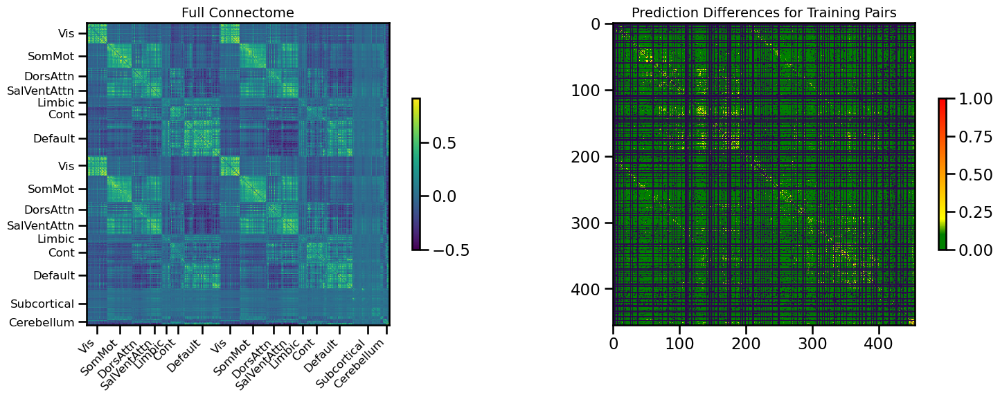

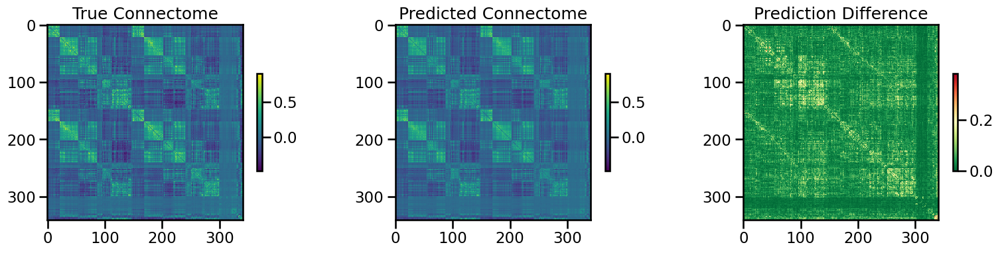

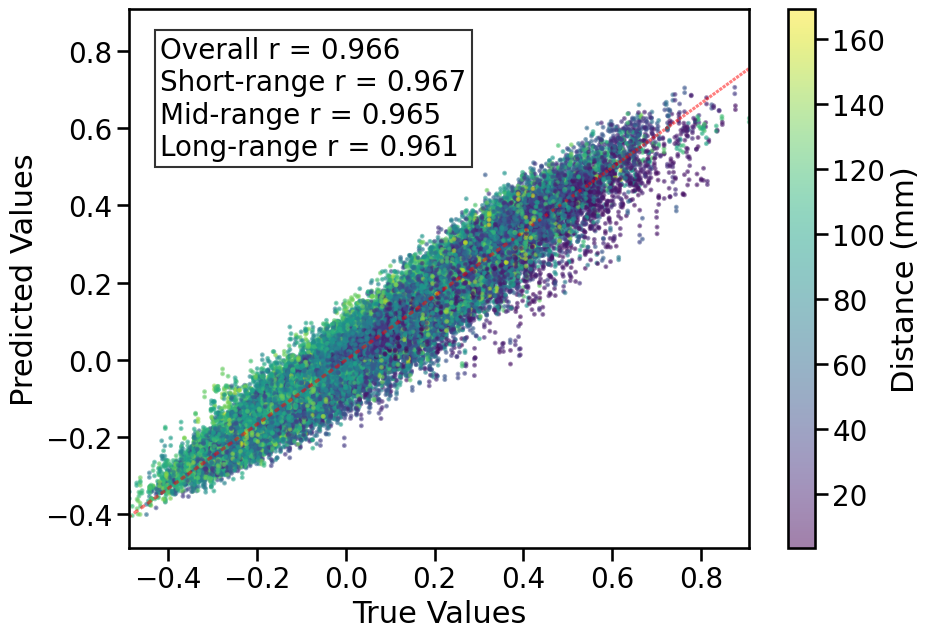

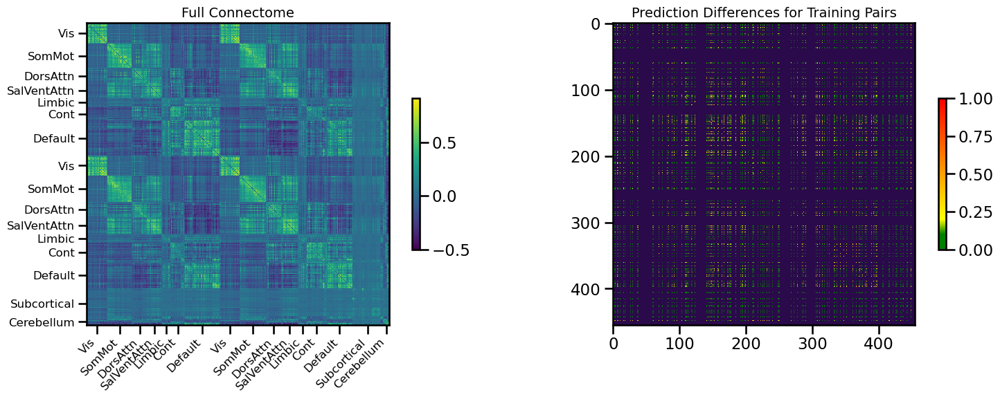

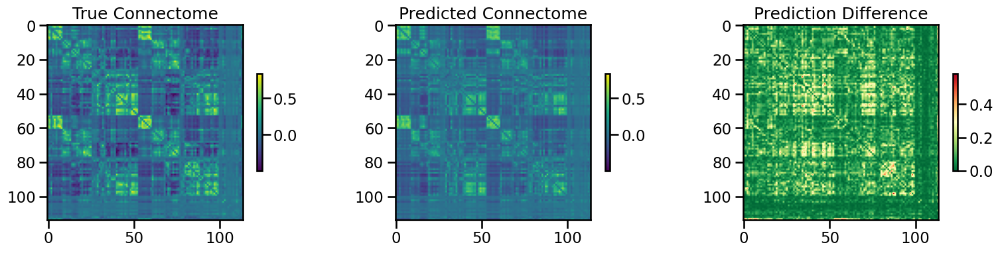

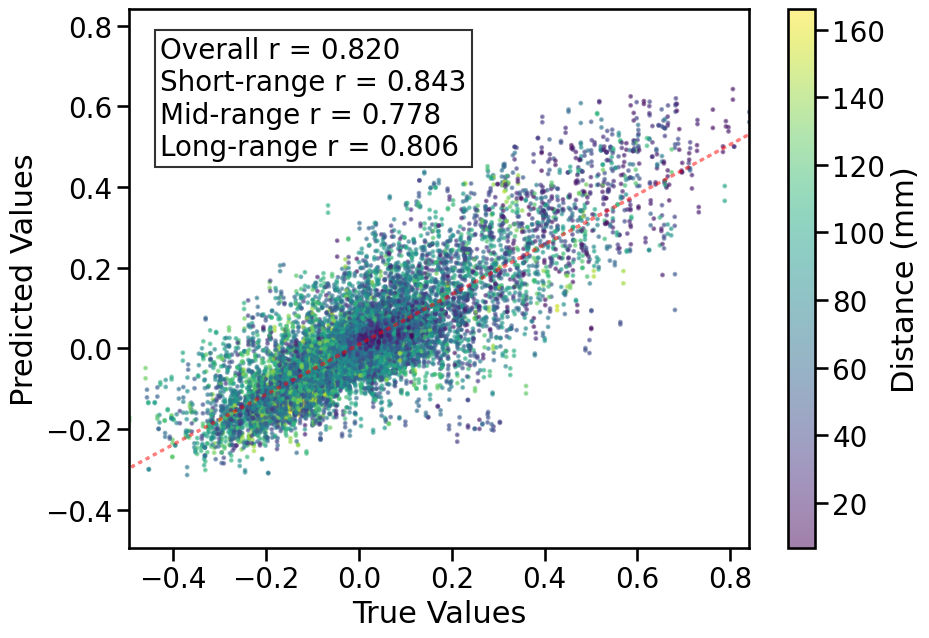


TRAIN METRICS: {'mse': 0.0025844846, 'mae': 0.03642716, 'r2': 0.9223491812288124, 'pearson_corr': 0.9664497483253236, 'geodesic_distance': 17.45208241013651}
TEST METRICS: {'mse': 0.0116288345, 'mae': 0.07685925, 'r2': 0.6681716221215896, 'pearson_corr': 0.8203095512800151, 'geodesic_distance': 10.439568893783132}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'binarize': False, 'batch_size': 512, 'epochs': 100}
1
2
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'encoder_indices': array([  0,   1,   2,   3,   5,   6,   7,   8,   9,  10,  11,  13,  14,
        15,  16,  17,  18,  19,  20,  21,  22,  24,  25,  26,  29,  30,
        31,  33,  34,  36,  38,  39,  40,  42,  43,  45,  46,  48,  49,
        50,  52,  53,  54,  55,  56,  57,  58,  59,  60,  62,  63,  64,
        66,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  87,  88,  89,  90,  91,  92,  93,  94,  96,
        99, 101, 102, 103, 104, 105, 106, 108, 109, 110, 111, 113, 114,
      

  warnings.warn(



X_full shape: (455, 7380)
Y_full shape: (455, 455)
X_train shape: (341, 7380)
Y_train shape: (341, 341)
x_projector shape: torch.Size([7380, 10])
x_loadings shape: torch.Size([7380, 10])
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.06 GB
Best val loss so far at epoch 1: 0.0463
Best val loss so far at epoch 2: 0.0340
Best val loss so far at epoch 3: 0.0321
Best val loss so far at epoch 4: 0.0298
Best val loss so far at epoch 5: 0.0289
Epoch 5/100, Train Loss: 0.0587, Val Loss: 0.0289, Time: 2.02s
Best val loss so far at epoch 6: 0.0275
Best val loss so far at epoch 7: 0.0273
Best val loss so far at epoch 8: 0.0268
Best val loss so far at epoch 9: 0.0263
Best val loss so far at epoch 10: 0.0259
Epoch 10/100, Train Loss: 0.0316, Val Loss: 0.0259, Time: 2.01s
Best val loss so far at epoch 11: 0.0253
Best val loss so far at epoch 12: 0.0244
Best val loss so far at epoch 13: 0.0238
Best val loss so far at epoch 14: 0.0233
Best val loss so far at epoch 15: 0.0225
Epoch

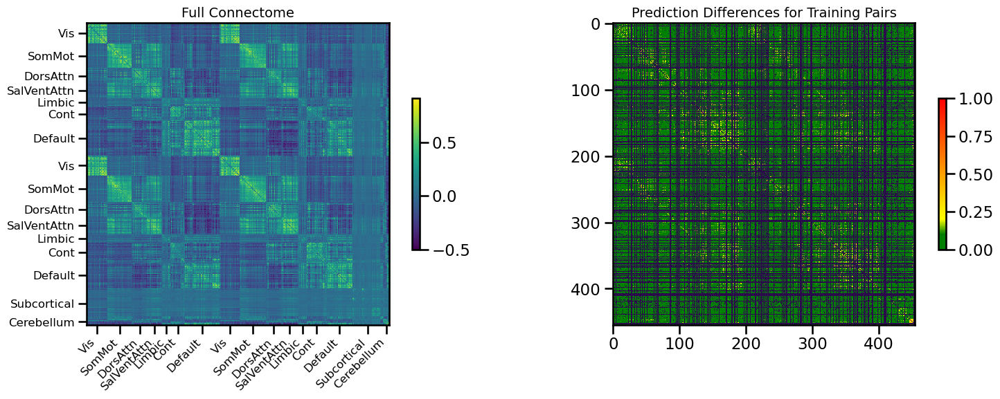

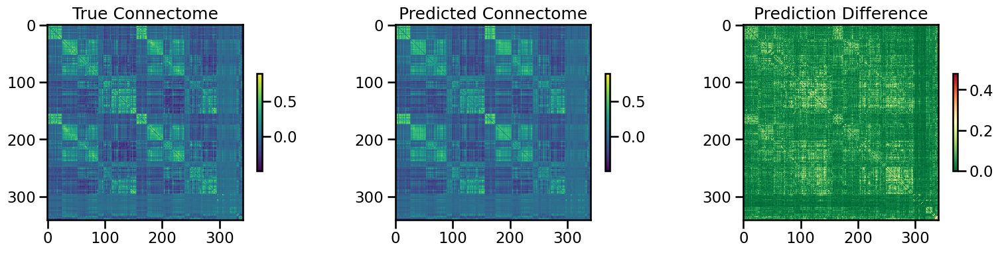

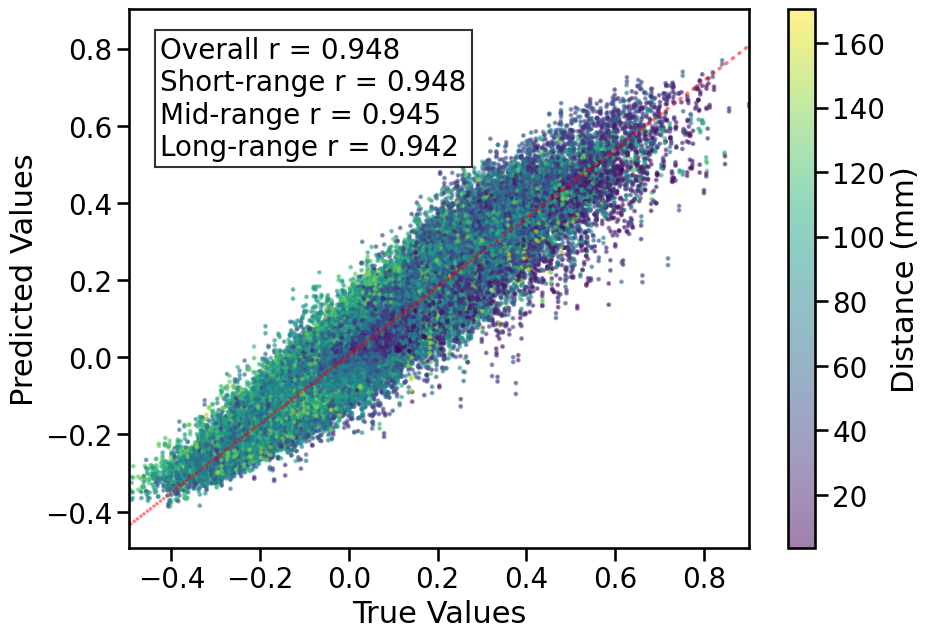

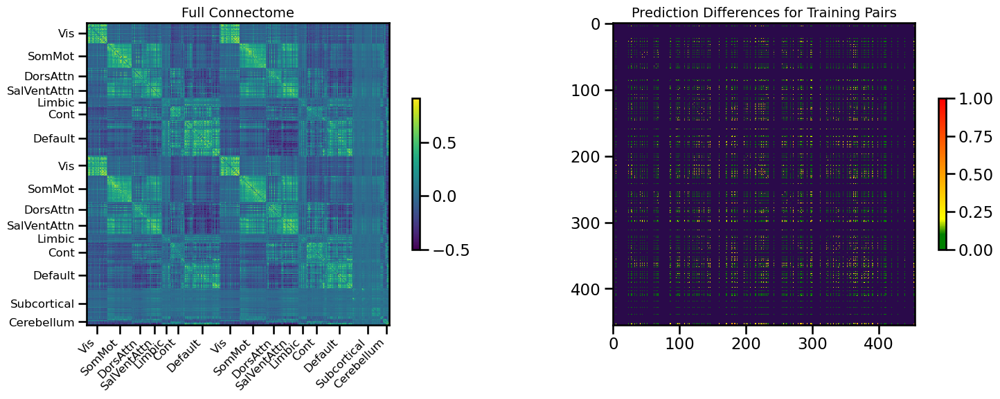

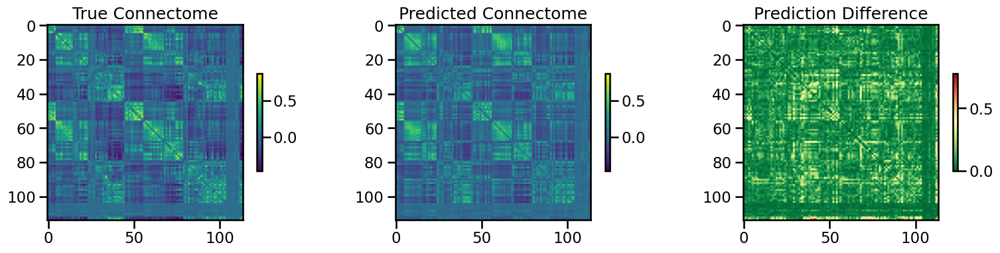

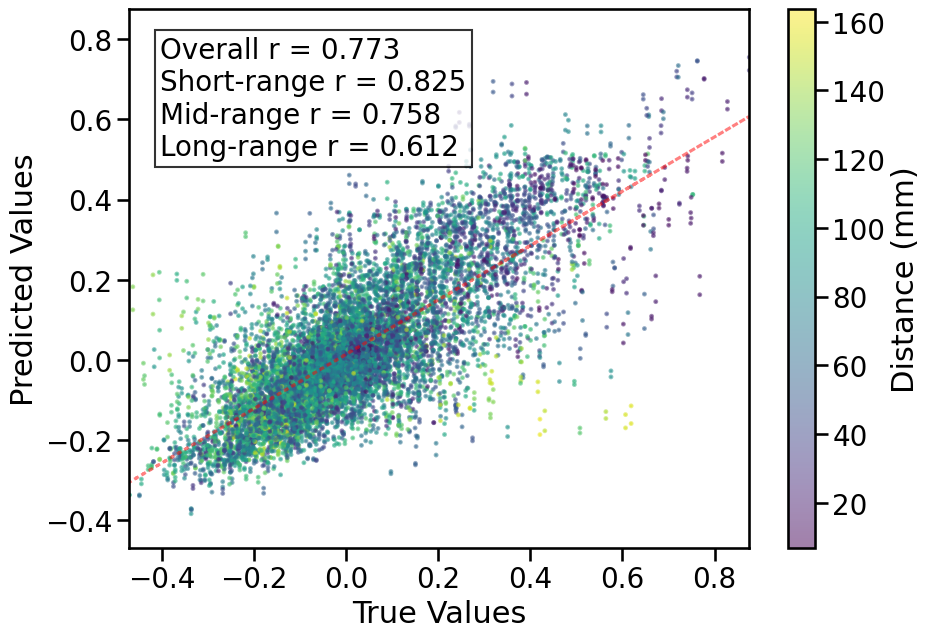


TRAIN METRICS: {'mse': 0.0033735198, 'mae': 0.041943442, 'r2': 0.898147042969572, 'pearson_corr': 0.9479028034858276, 'geodesic_distance': 18.342365275346296}
TEST METRICS: {'mse': 0.014129429, 'mae': 0.08295739, 'r2': 0.58388816194596, 'pearson_corr': 0.7726678617792632, 'geodesic_distance': 10.946239443486647}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'binarize': False, 'batch_size': 512, 'epochs': 100}
1
2
3
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'encoder_indices': array([  0,   2,   3,   4,   5,   6,   7,   9,  10,  11,  12,  15,  16,
        17,  18,  19,  22,  23,  24,  25,  26,  27,  28,  29,  30,  31,
        32,  33,  35,  36,  37,  38,  39,  41,  42,  44,  45,  46,  47,
        51,  55,  56,  57,  59,  60,  61,  63,  65,  66,  67,  68,  69,
        70,  72,  73,  74,  75,  76,  77,  78,  79,  81,  82,  83,  84,
        85,  86,  89,  90,  92,  93,  94,  95,  96,  97,  98, 100, 101,
       103, 104, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       1

  warnings.warn(



X_full shape: (455, 7380)
Y_full shape: (455, 455)
X_train shape: (342, 7380)
Y_train shape: (342, 342)
x_projector shape: torch.Size([7380, 10])
x_loadings shape: torch.Size([7380, 10])
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.06 GB
Best val loss so far at epoch 1: 0.0369
Best val loss so far at epoch 2: 0.0298
Best val loss so far at epoch 3: 0.0277
Best val loss so far at epoch 4: 0.0264
Best val loss so far at epoch 5: 0.0254
Epoch 5/100, Train Loss: 0.0454, Val Loss: 0.0254, Time: 2.29s
Best val loss so far at epoch 6: 0.0249
Best val loss so far at epoch 7: 0.0237
Best val loss so far at epoch 8: 0.0228
Best val loss so far at epoch 9: 0.0216
Best val loss so far at epoch 10: 0.0212
Epoch 10/100, Train Loss: 0.0259, Val Loss: 0.0212, Time: 1.88s
Best val loss so far at epoch 11: 0.0207
Best val loss so far at epoch 13: 0.0200
Best val loss so far at epoch 14: 0.0200
Best val loss so far at epoch 15: 0.0197
Epoch 15/100, Train Loss: 0.0199, Val Loss: 0.

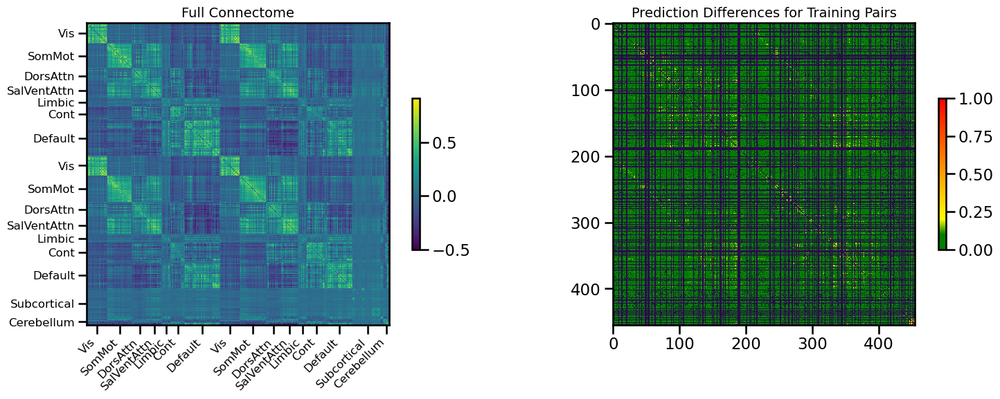

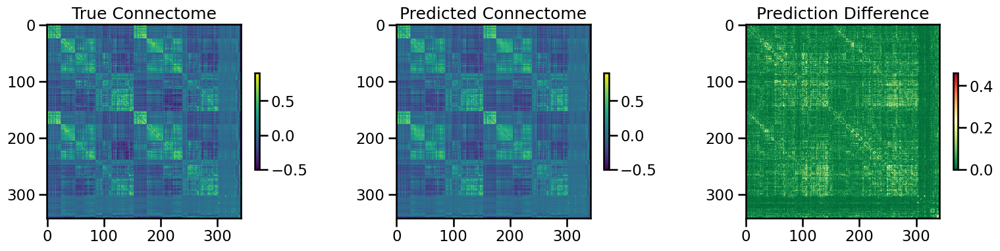

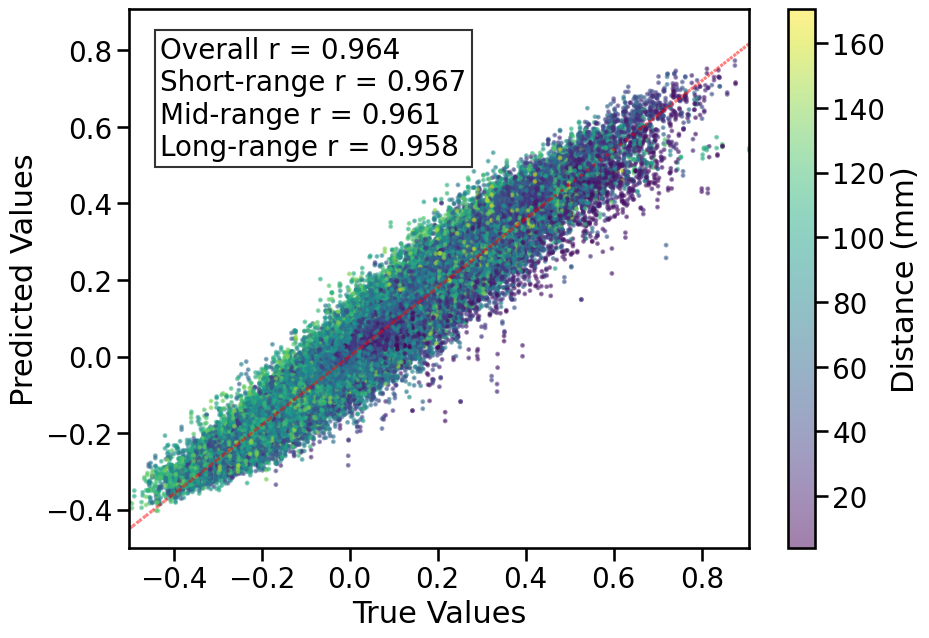

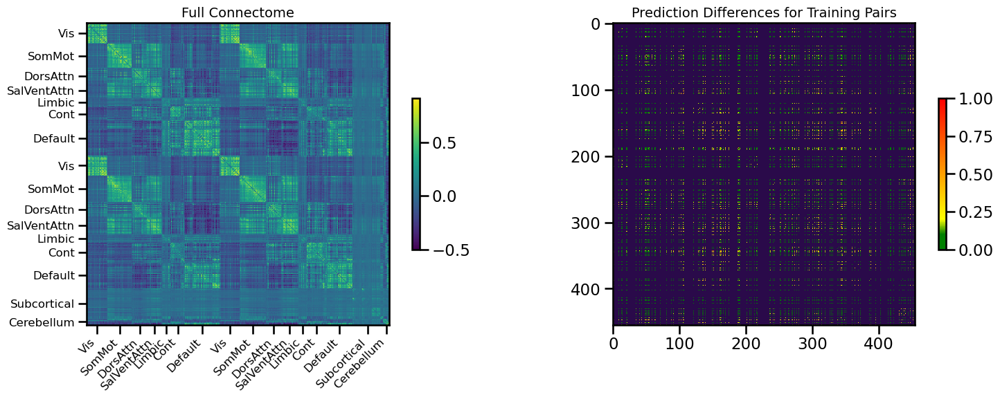

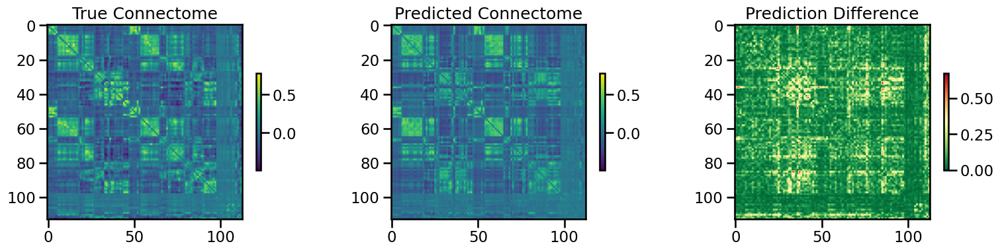

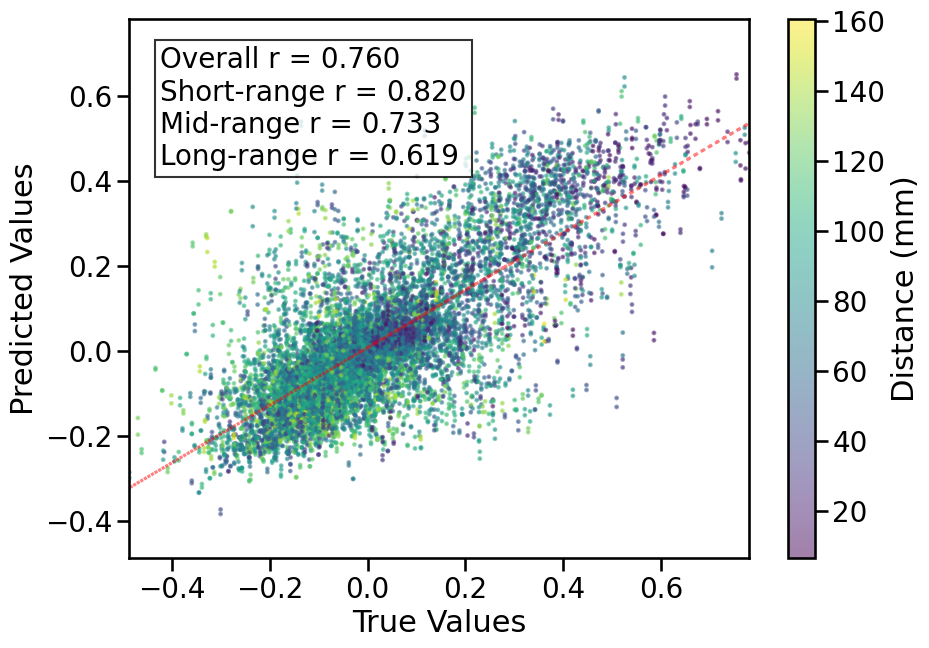


TRAIN METRICS: {'mse': 0.0024290872, 'mae': 0.03541425, 'r2': 0.9283863393810402, 'pearson_corr': 0.9640264627236028, 'geodesic_distance': 16.21037959723107}
TEST METRICS: {'mse': 0.014432669, 'mae': 0.08345445, 'r2': 0.5605567728184332, 'pearson_corr': 0.7600031746829183, 'geodesic_distance': 10.646581173139952}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'binarize': False, 'batch_size': 512, 'epochs': 100}
CPU Usage: 49.2%
RAM Usage: 8.6%
Available RAM: 1.3T
Total RAM: 1.5T
| ID | GPU | MEM |
------------------
|  0 |  0% |  1% |
Simulation completed in 766.10 seconds (12.77 minutes)


36466

In [18]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              use_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              parcellation='S400',
              hemisphere='both',
              connectome_target='FC',
              binarize=False,
              impute_strategy='mirror_interpolate',
              sort_genes='expression',
              gene_list='0.2',
              cv_type='random',
              random_seed=42,
              search_method=('wandb', 'mse', 1),
              track_wandb=False,
              skip_cv=True,
              model_type='pls',
              use_gpu=True
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
# Clear CPU memory
gc.collect()